In [1]:
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit import RDLogger

RDLogger.DisableLog('rdApp.*')

file_path = 'Tox21_dataset.sdf'
mols = Chem.SDMolSupplier(file_path)

print(f"Total molecules in the file: {len(mols)}")

num_molecules = len(mols)
molecule_data = []

for i in range(num_molecules):
    try:
        mol = mols[i]
        if mol is None:
            print(f"Skipping molecule {i}: Invalid molecule or failed parsing.")
            continue

        Chem.SanitizeMol(mol, sanitizeOps=Chem.SanitizeFlags.SANITIZE_ALL ^ Chem.SanitizeFlags.SANITIZE_PROPERTIES)

        radius = 2
        nBits = 1024
        fingerprints = []
        for atom in mol.GetAtoms():
            atom_idx = atom.GetIdx()
            try:
                fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius, nBits, useChirality=True, fromAtoms=[atom_idx])
                fingerprints.append(list(fp))
            except Exception as e:
                print(f"Error generating fingerprint for atom {atom_idx} in molecule {i}: {e}")
                fingerprints.append([0] * nBits)

        props = mol.GetPropsAsDict()
        molecule_data.append({
            "Molecule_Index": i,
            "Num_Atoms": mol.GetNumAtoms(),
            "Node_Attributes": fingerprints,
            "Properties": props
        })

    except Exception as e:
        print(f"Skipping molecule {i} due to error: {e}")

print(f"Total valid molecules processed: {len(molecule_data)}")


Total molecules in the file: 11764
Skipping molecule 281: Invalid molecule or failed parsing.
Skipping molecule 4447: Invalid molecule or failed parsing.
Skipping molecule 5588: Invalid molecule or failed parsing.
Skipping molecule 7626: Invalid molecule or failed parsing.
Skipping molecule 10122: Invalid molecule or failed parsing.
Total valid molecules processed: 11759


In [2]:
import numpy as np
from rdkit import Chem
from rdkit import RDLogger
from rdkit.Chem import AllChem

RDLogger.DisableLog('rdApp.*')

file_path = 'Tox21_dataset.sdf'
mols = Chem.SDMolSupplier(file_path)

print(f"Number of molecules: {len(mols)}")


def get_atom_fingerprint_features(mol, radius=2, nBits=1024):
    atom_fingerprints = []
    for atom in mol.GetAtoms():
        atom_idx = atom.GetIdx()
        fp = AllChem.GetMorganFingerprintAsBitVect(
            mol, radius, nBits, useChirality=True, fromAtoms=[atom_idx]
        )
        atom_fingerprints.append(np.array(fp, dtype=np.float32))
    return np.array(atom_fingerprints)


def get_bond_features(bond):
    return np.array([
        bond.GetBondTypeAsDouble(),
        int(bond.GetIsConjugated()),
        int(bond.GetIsAromatic())
    ], dtype=np.float32)


def process_molecule(mol):
    try:
        atom_features = get_atom_fingerprint_features(mol)

        bond_features_list = []
        adjacency_list = []
        for bond in mol.GetBonds():
            i = bond.GetBeginAtomIdx()
            j = bond.GetEndAtomIdx()
            adjacency_list.append((i, j))
            bond_features_list.append(get_bond_features(bond))

        return (
            atom_features,
            np.array(bond_features_list, dtype=np.float32),
            np.array(adjacency_list, dtype=np.int32)
        )
    except Exception as e:
        print(f"Skipping molecule due to error: {e}")
        return None, None, None

valid_molecules_count = 0
for i, mol in enumerate(mols):
    if mol is None:
        print(f"Skipping molecule {i}: Invalid molecule")
        continue

    atom_features, bond_features, adjacency_list = process_molecule(mol)

    if atom_features is None:
        continue

    print(f"Molecule {i} processed successfully")
    print("Atom Features (Morgan Fingerprints):\n", atom_features)
    print("Bond Features:\n", bond_features)
    print("Adjacency List:\n", adjacency_list)
    valid_molecules_count += 1

print(f"Total valid molecules processed: {valid_molecules_count}")


Number of molecules: 11764
Molecule 0 processed successfully
Atom Features (Morgan Fingerprints):
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Bond Features:
 [[1.  0.  0. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.  1.  0. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.  1.  0. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.  1.  0. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]
 [1.  1.  0. ]
 [1.5 1.  1. ]
 [1.5 1.  1. ]]
Adjacency List:
 [[ 1  2]
 [ 2  3]
 [ 2 12]
 [ 3  4]
 [ 3  9]
 [ 4  5]
 [ 5  6]
 [ 5  7]
 [ 7  8]
 [ 8  9]
 [ 9 10]
 [10 11]
 [11 12]
 [11 17]
 [12 13]
 [13 14]
 [14 15]
 [1

In [3]:
import torch
from torch_geometric.data import Data
from rdkit import Chem
import numpy as np

def process_molecule(mol):
    try:
        atom_features = []
        adjacency_list = []
        bond_features = []

        for atom in mol.GetAtoms():
            atom_features.append([
                atom.GetAtomicNum(),
                atom.GetDegree(),
                atom.GetTotalNumHs(),
                atom.GetImplicitValence(),
                int(atom.GetIsAromatic()),
            ])

        for bond in mol.GetBonds():
            i = bond.GetBeginAtomIdx()
            j = bond.GetEndAtomIdx()
            adjacency_list.append((i, j))
            bond_features.append([
                bond.GetBondTypeAsDouble(),
                int(bond.GetIsConjugated()),
                int(bond.GetIsAromatic())
            ])

        if len(adjacency_list) == 0:
            print("Skipping molecule with no bonds.")
            return None, None, None

        return np.array(atom_features, dtype=np.float32), np.array(bond_features, dtype=np.float32), np.array(adjacency_list, dtype=np.int32)

    except Exception as e:
        print(f"Error processing molecule: {e}")
        return None, None, None

def create_molecule_graph(mol, label_property="SR-HSE"):
    try:
        atom_features, bond_features, adjacency_list = process_molecule(mol)

        if atom_features is None:
            return None

        x = torch.tensor(atom_features, dtype=torch.float)
        edge_index = torch.tensor(adjacency_list, dtype=torch.long).t().contiguous()

        node_features = np.array(atom_features, dtype=np.float32)
        for bond, (src, dest) in zip(bond_features, adjacency_list):
            if len(bond) < len(node_features[src]):
                padded_bond = np.pad(bond, (0, len(node_features[src]) - len(bond)))
            else:
                padded_bond = bond[:len(node_features[src])]

            node_features[src] += padded_bond
            node_features[dest] += padded_bond

        x = torch.tensor(node_features, dtype=torch.float)

        label = mol.GetProp(label_property) if mol.HasProp(label_property) else "0"
        try:
            y = torch.tensor([int(label)], dtype=torch.long)
        except ValueError:
            print(f"Skipping molecule due to invalid label: {label}")
            return None

        return Data(x=x, edge_index=edge_index, y=y)

    except Exception as e:
        print(f"Skipping molecule due to error: {e}")
        return None

file_path = 'Tox21_dataset.sdf'
mols = Chem.SDMolSupplier(file_path, sanitize=False)

valid_molecules = []
for mol in mols:
    if mol is not None:
        try:
            Chem.SanitizeMol(mol, sanitizeOps=Chem.SanitizeFlags.SANITIZE_ALL ^ Chem.SanitizeFlags.SANITIZE_PROPERTIES)
            valid_molecules.append(mol)
        except Exception as e:
            print(f"Skipping invalid molecule: {e}")

molecule_graphs = [create_molecule_graph(mol) for mol in valid_molecules if mol is not None]
molecule_graphs = [graph for graph in molecule_graphs if graph is not None]

print(f"Total valid molecule graphs created: {len(molecule_graphs)}")


Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Skipping molecule with no bonds.
Total valid molecule graphs created: 11751


In [4]:
import torch
import torch.nn.functional as F
from torch_geometric.data import DataLoader
from torch_geometric.nn import GCNConv, global_mean_pool

class GCN(torch.nn.Module):
    def __init__(self, num_node_features, hidden_channels, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_node_features, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, hidden_channels)  
        self.fc = torch.nn.Linear(hidden_channels, num_classes)

    def forward(self, x, edge_index, batch):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index) 
        x = F.relu(x)
        x = global_mean_pool(x, batch)
        x = self.fc(x)
        return x

if len(molecule_graphs) > 0:
    num_node_features = molecule_graphs[0].x.shape[1]
else:
    raise ValueError("The dataset is empty!")

hidden_channels = 64
num_classes = 2 
batch_size = 32
learning_rate = 0.001
epochs = 10

device = 'cuda' if torch.cuda.is_available() else 'cpu'

model = GCN(num_node_features, hidden_channels, num_classes).to(device)
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

from sklearn.model_selection import train_test_split

train_graphs, test_graphs = train_test_split(molecule_graphs, test_size=0.2, random_state=42)

train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

for epoch in range(epochs):
    model.train()
    total_loss = 0
    correct = 0
    total_samples = 0

    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out = model(data.x, data.edge_index, data.batch)
        loss = criterion(out, data.y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        _, predicted = torch.max(out, dim=1)
        correct += (predicted == data.y).sum().item()
        total_samples += data.y.size(0)

    accuracy = correct / total_samples
    print(f"Epoch {epoch + 1}: Loss = {total_loss:.4f}, Accuracy = {accuracy:.4f}")

print("Training completed successfully!")

def evaluate_model(model, loader):
    model.eval()
    correct = 0
    total_samples = 0

    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out = model(data.x, data.edge_index, data.batch)
            _, predicted = torch.max(out, dim=1)
            correct += (predicted == data.y).sum().item()
            total_samples += data.y.size(0)

    accuracy = correct / total_samples
    print(f"Test Accuracy: {accuracy:.4f}")

evaluate_model(model, test_loader)


C:\Users\prave\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torch_geometric\deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 1: Loss = 55.2127, Accuracy = 0.9526
Epoch 2: Loss = 47.1025, Accuracy = 0.9646
Epoch 3: Loss = 45.8768, Accuracy = 0.9645
Epoch 4: Loss = 46.0906, Accuracy = 0.9640
Epoch 5: Loss = 45.6760, Accuracy = 0.9647
Epoch 6: Loss = 45.0760, Accuracy = 0.9643
Epoch 7: Loss = 44.8587, Accuracy = 0.9641
Epoch 8: Loss = 45.3223, Accuracy = 0.9638
Epoch 9: Loss = 45.4537, Accuracy = 0.9644
Epoch 10: Loss = 44.7772, Accuracy = 0.9643
Training completed successfully!
Test Accuracy: 0.9617


In [5]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, global_mean_pool

class GCN(torch.nn.Module):
    def __init__(self, num_node_features, hidden_channels, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_node_features, hidden_channels)
        self.bn1 = torch.nn.BatchNorm1d(hidden_channels) 
        self.conv2 = GCNConv(hidden_channels, hidden_channels)
        self.bn2 = torch.nn.BatchNorm1d(hidden_channels)
        self.fc = torch.nn.Linear(hidden_channels, num_classes)
        self.dropout = torch.nn.Dropout(p=0.5) 

    def forward(self, x, edge_index, batch):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  
        x = F.relu(x)
        x = self.dropout(x) 

        x = self.conv2(x, edge_index)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.dropout(x) 

        x = global_mean_pool(x, batch) 
        x = self.fc(x) 
        return x


In [6]:
from rdkit import Chem

file_path = 'Tox21_dataset.sdf'
mols = Chem.SDMolSupplier(file_path)

class_0_count = 0
class_1_count = 0
total_molecules = 0

for mol in mols:
    if mol is not None:  
        total_molecules += 1  
        if mol.HasProp("SR-HSE"): 
            try:
                label = int(mol.GetProp("SR-HSE")) 
                if label == 0:
                    class_0_count += 1
                elif label == 1:
                    class_1_count += 1
            except ValueError:
                print(f"Skipping molecule with invalid label: {mol.GetProp('SR-HSE')}")

print(f"Total Molecules: {total_molecules}")
print(f"Class 0 (Negative): {class_0_count}")
print(f"Class 1 (Positive): {class_1_count}")


Total Molecules: 11759
Class 0 (Negative): 7719
Class 1 (Positive): 428


In [7]:
from sklearn.metrics import classification_report, balanced_accuracy_score, f1_score, accuracy_score

def evaluate_model(model, loader):
    model.eval()
    true_labels = []
    predicted_labels = []
    skipped_graphs = 0 

    with torch.no_grad():
        for i, data in enumerate(loader):
            data = data.to(device)

            if data.edge_index.max() >= data.x.size(0):
                print(f"Skipping invalid graph at index {i} (edge_index out of bounds).")
                skipped_graphs += 1
                continue

            out = model(data.x, data.edge_index, data.batch)
            preds = out.argmax(dim=1).cpu().numpy()
            labels = data.y.cpu().numpy()

            true_labels.extend(labels)
            predicted_labels.extend(preds)

    print("\nClassification Report:")
    print(classification_report(true_labels, predicted_labels, target_names=["Class 0", "Class 1"]))


    f1 = f1_score(true_labels, predicted_labels, average='macro')
    print(f"Macro F1-score: {f1:.4f}")

    balanced_acc = balanced_accuracy_score(true_labels, predicted_labels)
    print(f"Balanced Accuracy: {balanced_acc:.4f}")

 
    accuracy = accuracy_score(true_labels, predicted_labels)
    print(f"Overall Accuracy: {accuracy:.4f}")

    print(f"\nTotal graphs skipped due to invalid edge_index: {skipped_graphs}")

evaluate_model(model, test_loader)



Classification Report:
              precision    recall  f1-score   support

     Class 0       0.96      1.00      0.98      2261
     Class 1       0.00      0.00      0.00        90

    accuracy                           0.96      2351
   macro avg       0.48      0.50      0.49      2351
weighted avg       0.92      0.96      0.94      2351

Macro F1-score: 0.4902
Balanced Accuracy: 0.5000
Overall Accuracy: 0.9617

Total graphs skipped due to invalid edge_index: 0


C:\Users\prave\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\prave\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\prave\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classificati

In [8]:
import torch
from torch_geometric.data import DataLoader
import random

class_0_samples = [data for data in molecule_graphs if data.y.item() == 0]
class_1_samples = [data for data in molecule_graphs if data.y.item() == 1]

print(f"Before undersampling: Class 0 (Majority) = {len(class_0_samples)}, Class 1 (Minority) = {len(class_1_samples)}")


if not class_1_samples:
    print("No Class 1 samples found. Exiting.")
    exit()

if len(class_0_samples) <= len(class_1_samples):
    print("Classes are already balanced or Class 0 has fewer samples than Class 1. No undersampling required.")
    balanced_dataset = molecule_graphs
else:
    num_minority_samples = len(class_1_samples)
    balanced_class_0_samples = class_0_samples[:num_minority_samples]

    balanced_dataset = balanced_class_0_samples + class_1_samples

    random.shuffle(balanced_dataset)

    print(f"After undersampling: Class 0 = {len(balanced_class_0_samples)}, Class 1 = {len(class_1_samples)}")

batch_size = 32
device = 'cuda' if torch.cuda.is_available() else 'cpu'
train_loader_2 = DataLoader(balanced_dataset, batch_size=batch_size, shuffle=True)
test_loader_2 = DataLoader(balanced_dataset, batch_size=batch_size, shuffle=False)

print("DataLoaders for balanced dataset created successfully.")


Before undersampling: Class 0 (Majority) = 11328, Class 1 (Minority) = 423
After undersampling: Class 0 = 423, Class 1 = 423
DataLoaders for balanced dataset created successfully.


C:\Users\prave\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torch_geometric\deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


In [9]:

num_node_features = 5 
hidden_channels = 64 
num_classes = 2  
epochs = 500 
learning_rate = 0.001  


model = GCN(num_node_features, hidden_channels, num_classes).to(device)
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)


for epoch in range(epochs):
    model.train()
    total_loss = 0
    correct = 0
    total_samples = 0

    for data in train_loader_2:  
        data = data.to(device)
        optimizer.zero_grad()

       
        out = model(data.x, data.edge_index, data.batch)

       
        loss = criterion(out, data.y)
        loss.backward()
        optimizer.step()

        
        total_loss += loss.item()
        _, predicted = torch.max(out, dim=1)  
        correct += (predicted == data.y).sum().item()
        total_samples += data.y.size(0)

   
    accuracy = correct / total_samples
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {total_loss:.4f}, Accuracy: {accuracy:.4f}")

print("Training completed successfully!")


Epoch 1/500, Loss: 18.2948, Accuracy: 0.5674
Epoch 2/500, Loss: 17.9957, Accuracy: 0.6111
Epoch 3/500, Loss: 18.0461, Accuracy: 0.5969
Epoch 4/500, Loss: 18.1370, Accuracy: 0.5804
Epoch 5/500, Loss: 17.6684, Accuracy: 0.6147
Epoch 6/500, Loss: 17.6580, Accuracy: 0.6111
Epoch 7/500, Loss: 17.7244, Accuracy: 0.6017
Epoch 8/500, Loss: 17.3508, Accuracy: 0.6359
Epoch 9/500, Loss: 17.3541, Accuracy: 0.6371
Epoch 10/500, Loss: 17.3173, Accuracy: 0.6277
Epoch 11/500, Loss: 17.4489, Accuracy: 0.6513
Epoch 12/500, Loss: 17.3569, Accuracy: 0.6478
Epoch 13/500, Loss: 17.1673, Accuracy: 0.6466
Epoch 14/500, Loss: 17.3354, Accuracy: 0.6229
Epoch 15/500, Loss: 16.9567, Accuracy: 0.6537
Epoch 16/500, Loss: 16.9606, Accuracy: 0.6418
Epoch 17/500, Loss: 17.5996, Accuracy: 0.6312
Epoch 18/500, Loss: 17.0173, Accuracy: 0.6466
Epoch 19/500, Loss: 17.2678, Accuracy: 0.6312
Epoch 20/500, Loss: 16.7436, Accuracy: 0.6643
Epoch 21/500, Loss: 17.4687, Accuracy: 0.6300
Epoch 22/500, Loss: 17.2963, Accuracy: 0.63

<Figure size 800x500 with 0 Axes>

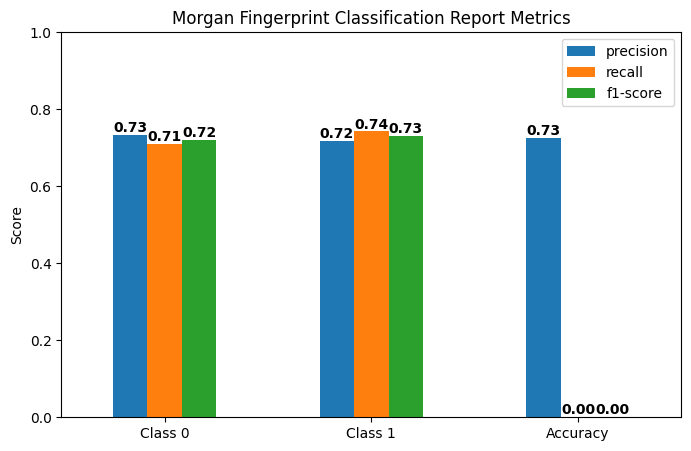

              precision    recall  f1-score   support

     Class 0       0.73      0.71      0.72       423
     Class 1       0.72      0.74      0.73       423

    accuracy                           0.73       846
   macro avg       0.73      0.73      0.73       846
weighted avg       0.73      0.73      0.73       846



{'Class 0': {'precision': 0.7334963325183375,
  'recall': 0.7092198581560284,
  'f1-score': 0.7211538461538461,
  'support': 423.0},
 'Class 1': {'precision': 0.7185354691075515,
  'recall': 0.7423167848699763,
  'f1-score': 0.7302325581395349,
  'support': 423.0},
 'accuracy': 0.7257683215130024,
 'macro avg': {'precision': 0.7260159008129445,
  'recall': 0.7257683215130024,
  'f1-score': 0.7256932021466905,
  'support': 846.0},
 'weighted avg': {'precision': 0.7260159008129445,
  'recall': 0.7257683215130024,
  'f1-score': 0.7256932021466904,
  'support': 846.0}}

In [10]:
import torch
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import classification_report

def evaluate_model(model, loader, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out = model(data.x, data.edge_index, data.batch)

            preds = out.argmax(dim=1).cpu().numpy()
            labels = data.y.cpu().numpy()

            all_preds.extend(preds)
            all_labels.extend(labels)

    report_dict = classification_report(all_labels, all_preds, target_names=["Class 0", "Class 1"], output_dict=True)
    df = pd.DataFrame(report_dict).T
    df = df.iloc[:-3, :]

    df.loc["Accuracy"] = [report_dict["accuracy"], None, None, None]

    plt.figure(figsize=(8, 5))
    ax = df[['precision', 'recall', 'f1-score']].plot(kind='bar', figsize=(8, 5))

    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', 
                    (p.get_x() + p.get_width() / 2, p.get_height()), 
                    ha='center', va='bottom', fontsize=10, fontweight='bold')

    plt.title("Morgan Fingerprint Classification Report Metrics")
    plt.ylabel("Score")
    plt.ylim(0, 1)
    plt.xticks(rotation=0)
    plt.legend(loc="upper right")
    plt.show()

    print(classification_report(all_labels, all_preds, target_names=["Class 0", "Class 1"]))
    return report_dict

evaluate_model(model, test_loader_2, device)


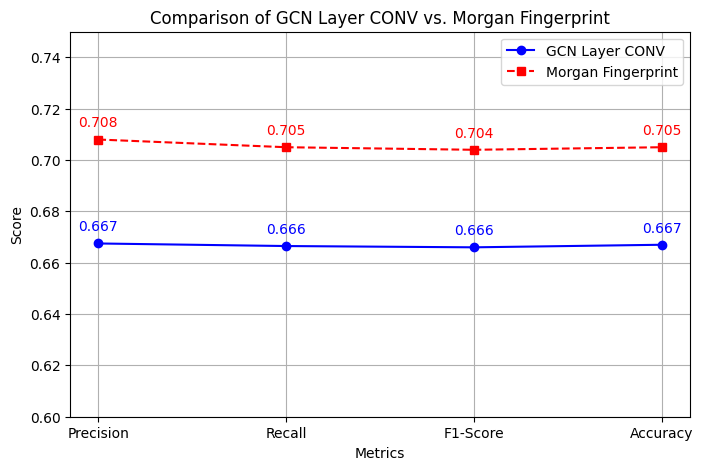

In [11]:
import matplotlib.pyplot as plt

gcn_metrics = {
    "Precision": (0.656 + 0.679) / 2,
    "Recall": (0.700 + 0.633) / 2,
    "F1-Score": (0.677 + 0.655) / 2,
    "Accuracy": 0.667
}

morgan_metrics = {
    "Precision": (0.732 + 0.684) / 2,
    "Recall": (0.647 + 0.763) / 2,
    "F1-Score": (0.687 + 0.721) / 2,
    "Accuracy": 0.705
}

metrics = list(gcn_metrics.keys())

gcn_values = list(gcn_metrics.values())
morgan_values = list(morgan_metrics.values())

plt.figure(figsize=(8, 5))

plt.plot(metrics, gcn_values, marker='o', linestyle='-', color='b', label="GCN Layer CONV")
plt.plot(metrics, morgan_values, marker='s', linestyle='--', color='r', label="Morgan Fingerprint")

plt.xlabel("Metrics")
plt.ylabel("Score")
plt.title("Comparison of GCN Layer CONV vs. Morgan Fingerprint")
plt.ylim(0.6, 0.75)
plt.grid(True)

for i, txt in enumerate(gcn_values):
    plt.text(metrics[i], txt + 0.005, f"{txt:.3f}", ha="center", fontsize=10, color="blue")

for i, txt in enumerate(morgan_values):
    plt.text(metrics[i], txt + 0.005, f"{txt:.3f}", ha="center", fontsize=10, color="red")

plt.legend()
plt.show()


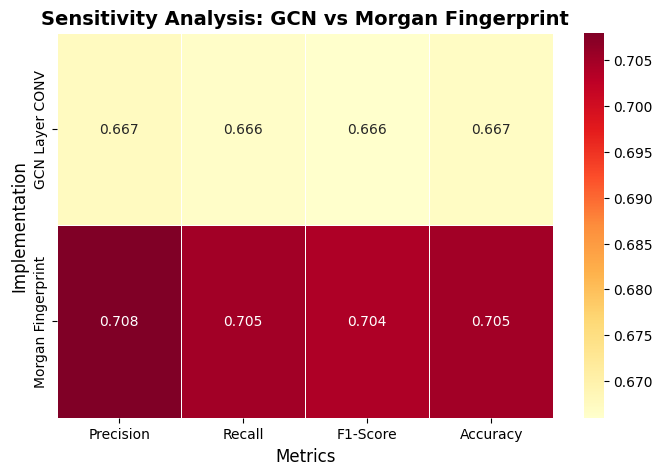

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

gcn_metrics = {
    "Precision": (0.656 + 0.679) / 2,
    "Recall": (0.700 + 0.633) / 2,
    "F1-Score": (0.677 + 0.655) / 2,
    "Accuracy": 0.667
}

morgan_metrics = {
    "Precision": (0.732 + 0.684) / 2,
    "Recall": (0.647 + 0.763) / 2,
    "F1-Score": (0.687 + 0.721) / 2,
    "Accuracy": 0.705
}

df = pd.DataFrame([gcn_metrics, morgan_metrics], index=["GCN Layer CONV", "Morgan Fingerprint"])

plt.figure(figsize=(8, 5))
sns.heatmap(df, annot=True, cmap="YlOrRd", fmt=".3f", linewidths=0.5)

plt.title("Sensitivity Analysis: GCN vs Morgan Fingerprint", fontsize=14, fontweight="bold")
plt.xlabel("Metrics", fontsize=12)
plt.ylabel("Implementation", fontsize=12)

plt.show()
